In [2]:
import cv2 # tested with the 3.1.0 version
import kornia
import numpy as np
import matplotlib.pyplot as plt
import os
import torch

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

In [2]:
# !pip install --user kornia

In [3]:
pytorch_device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# 2. Basic Image Operations with OpenCV and Kornia
## 2.1 Image Read/Write with OpenCV

In [4]:
# a) read image.
def my_imread(imagepath):
    image = cv2.imread(imagepath) # Read the image from imagepath.
    return image

IMG_NAME = '3096.jpg' # Choose an image filename from "data/img/"
IMG_PATH = os.path.join('data/img/', IMG_NAME)
image = my_imread(IMG_PATH)

In [5]:
# Optional: uncomment those lines to display the image using cv2.
# cv2.imshow('image', image)
# cv2.waitKey(0)
# cv2.destroyAllWindows()

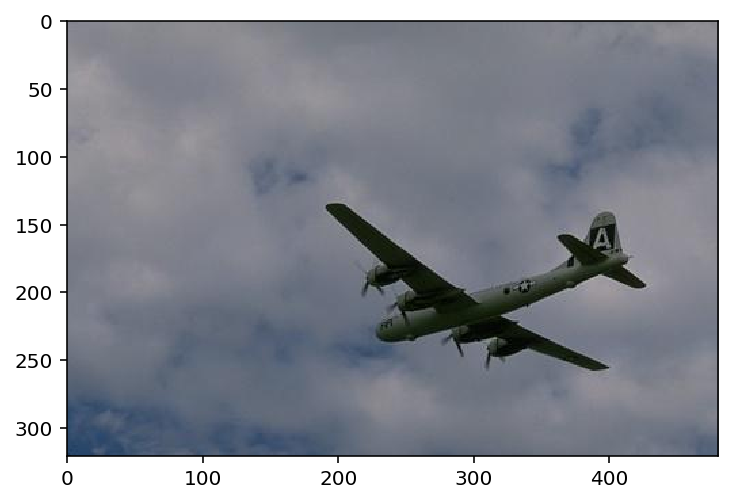

In [5]:
# Optional: uncomment those lines to display the correct color 
# image using pyplot
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB)) 

In [7]:
# b) Write the same image in RGB and Grayscale and save as
# "problem1_rgb.jpg" and "problem1_gray.jpg".
RGB_FILENAME = "problem1_rgb.jpg"
GRAY_FILENAME = "problem1_gray.jpg"
cv2.imwrite(RGB_FILENAME, image)
cv2.imwrite(GRAY_FILENAME, cv2.cvtColor(image, cv2.COLOR_BGR2GRAY))
# Once the two images have been generated in the current directory,
# run the next block to show your results.

True

### Display saved RGB image from current folder.
["rgb"](problem1_rgb.jpg)

### Display saved grayscale image from current folder.
["gray"](problem1_gray.jpg)

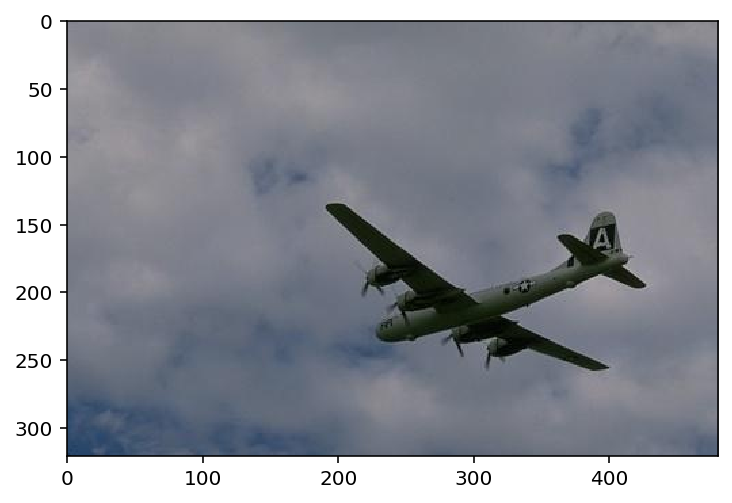

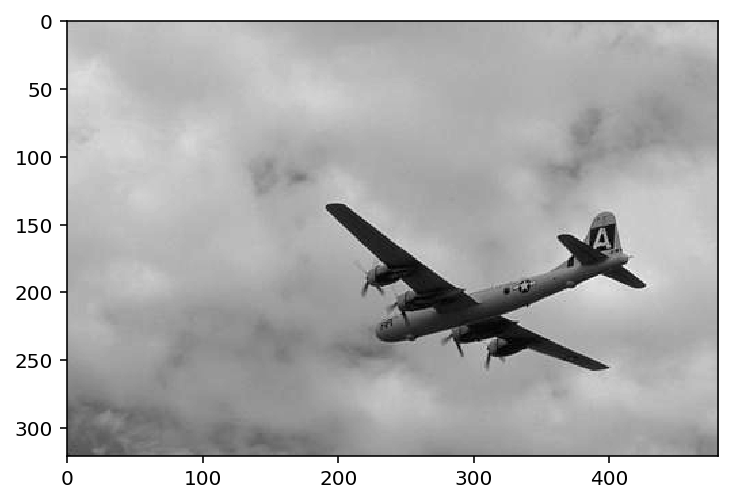

In [8]:
p1 = cv2.imread('problem1_rgb.jpg')
p1 = cv2.cvtColor(p1, cv2.COLOR_BGR2RGB)
plt.imshow(p1)

plt.figure()
p1_gray = cv2.imread('problem1_gray.jpg', 0)
plt.imshow(p1_gray, cmap = 'gray')

## 1.2 Image Smoothing

In [11]:
# Optional: plots an image
def plot_helper(img, title):
    plt.figure(figsize=(20, 20))
    plt.subplot(111), 
    plt.imshow(img), 
    plt.title(title)
    plt.xticks([]), 
    plt.yticks([])
    plt.show()

## Smoothing with OpenCV

kernel sizes are: [3, 21, 45]


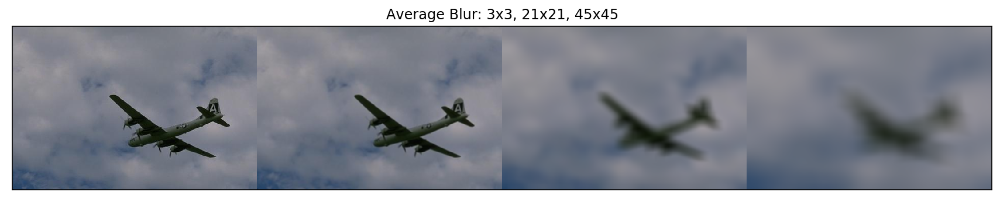

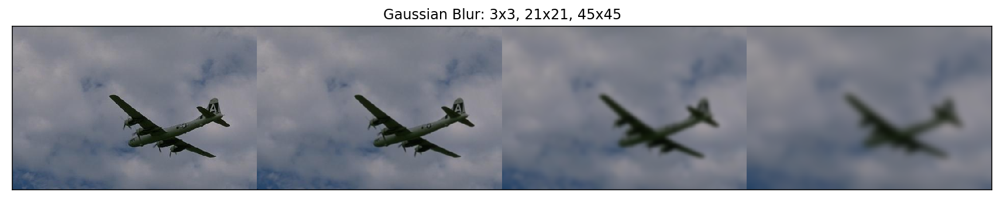

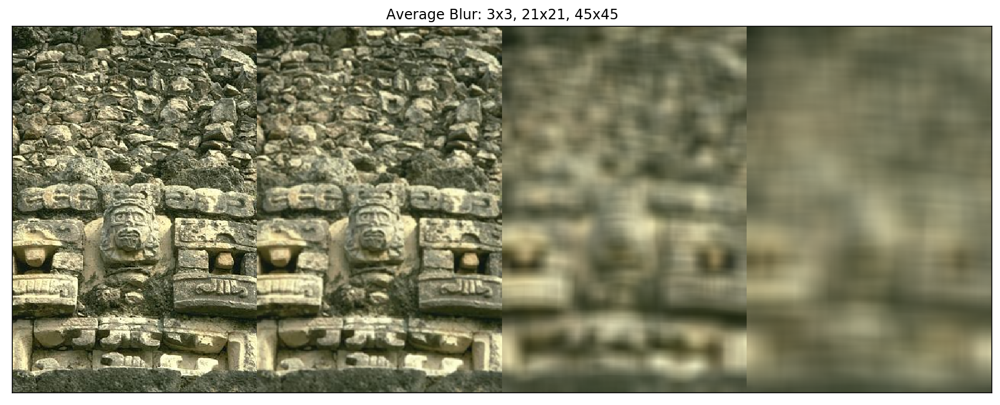

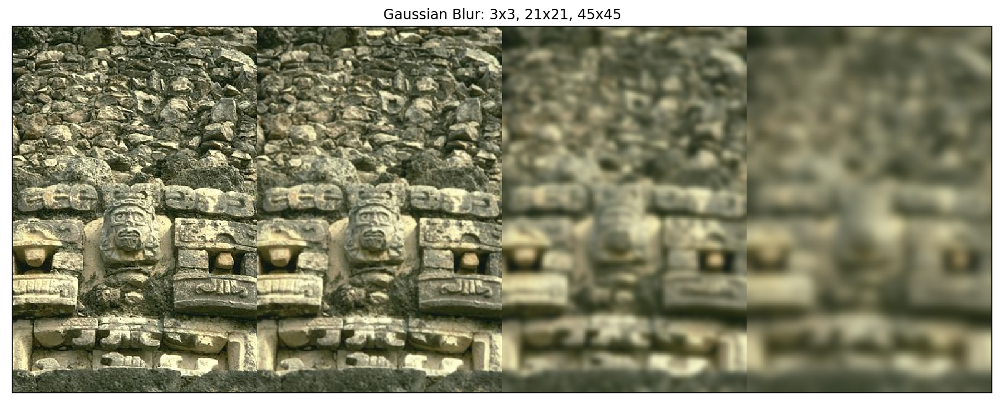

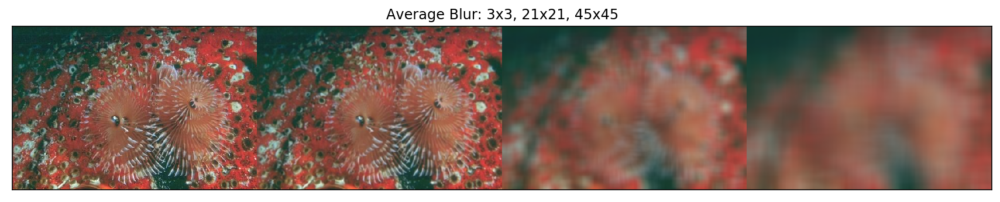

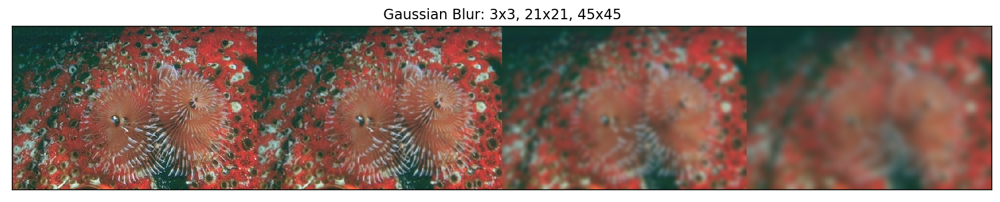

In [21]:
IMAGES = ['3096.jpg', '33039.jpg', '12084.jpg'] # choose 3 images from "data/img"
KERNEL_SIZES = [3, 21, 45] # choose at least 3 different filter sizes
print ("kernel sizes are:", KERNEL_SIZES)
for i in range(len(IMAGES)):
    imagepath = os.path.join('data/img/', IMAGES[i])
    image = my_imread(imagepath)
    avg_blurs = [image]
    gaus_blurs = [image]
    for j in range(len(KERNEL_SIZES)):
        kernel_size = KERNEL_SIZES[j]
        # a) average smoothing
        avg_blur = cv2.blur(image, (kernel_size,kernel_size))
        avg_blurs.append(avg_blur)
        # b) gaussian smoothing
        gaus_blur = cv2.GaussianBlur(image, (kernel_size,kernel_size), 0)
        gaus_blurs.append(gaus_blur)
    avg_stack = np.hstack(avg_blurs)
    gaus_stack = np.hstack(gaus_blurs)
    
    # Optional: you could choose to use plot_helper to plot avg_stack and gaus_stack.
    # Make sure they are in RGB before using plot_helper.
    plot_helper(cv2.cvtColor(avg_stack, cv2.COLOR_BGR2RGB),\
                "Average Blur: %dx%d, %dx%d, %dx%d"%\
                (KERNEL_SIZES[0], KERNEL_SIZES[0],\
                 KERNEL_SIZES[1], KERNEL_SIZES[1],\
                 KERNEL_SIZES[2], KERNEL_SIZES[2]))
    plot_helper(cv2.cvtColor(gaus_stack, cv2.COLOR_BGR2RGB),\
                "Gaussian Blur: %dx%d, %dx%d, %dx%d"%\
                (KERNEL_SIZES[0], KERNEL_SIZES[0],\
                 KERNEL_SIZES[1], KERNEL_SIZES[1],\
                 KERNEL_SIZES[2], KERNEL_SIZES[2]))
    

## Smoothing with Kornia

In [17]:
image.shape, np.asarray(image).transpose(-1, 0, 1).shape

((321, 481, 3), (3, 321, 481))

kernel sizes are: [3, 21, 45]


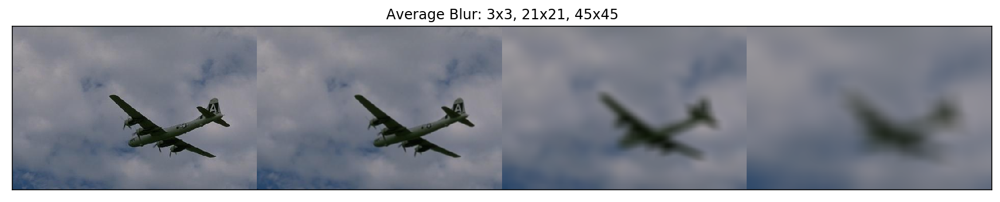

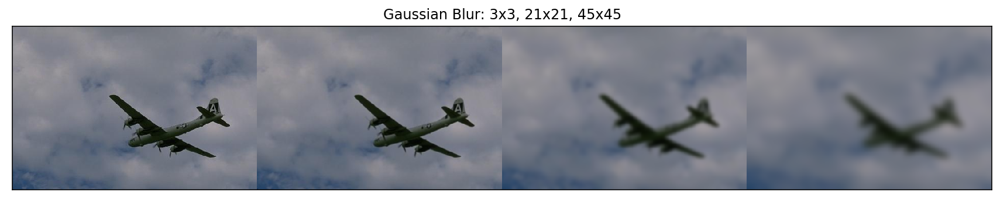

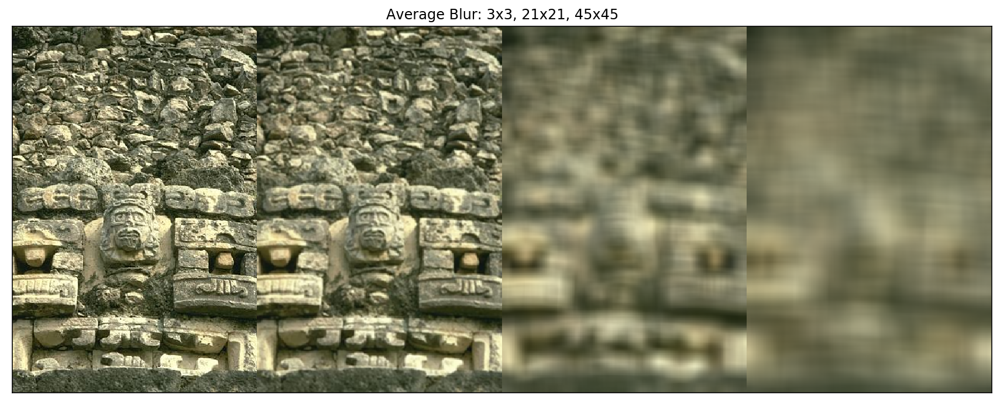

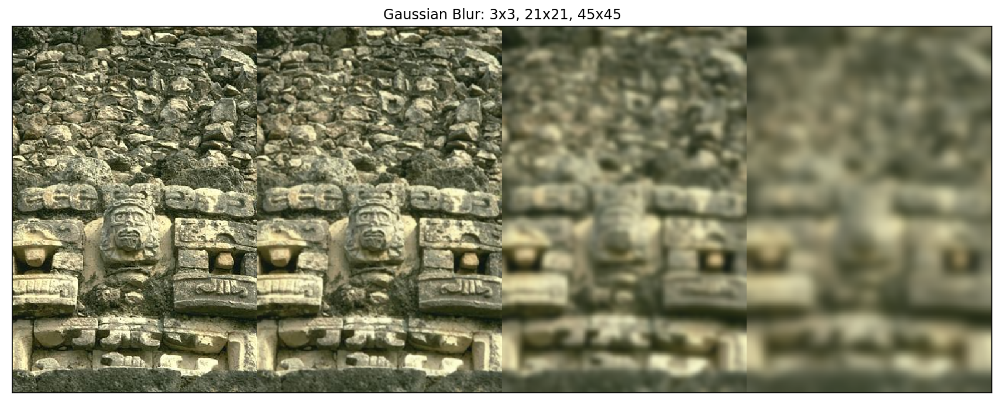

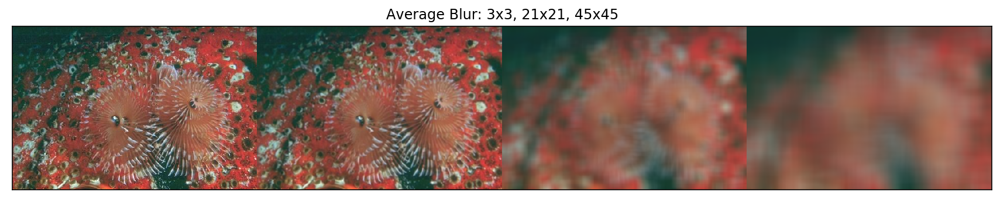

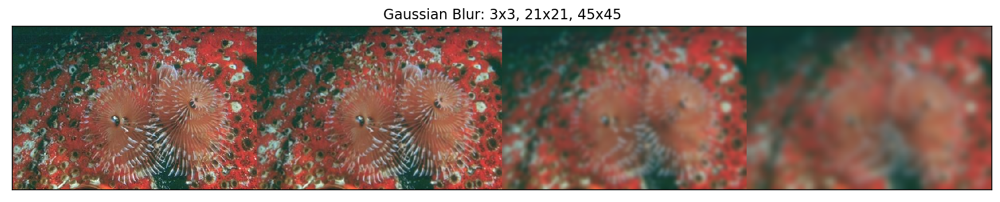

In [20]:
### Kornia
IMAGES = ['3096.jpg', '33039.jpg', '12084.jpg'] # choose 3 images from "data/img"
KERNEL_SIZES = [3, 21, 45] # choose at least 3 different filter sizes
print ("kernel sizes are:", KERNEL_SIZES)
for i in range(len(IMAGES)):
    imagepath = os.path.join('data/img/', IMAGES[i])
    image = my_imread(imagepath)
    avg_blurs = [image]
    gaus_blurs = [image]
    image_tensor = torch.from_numpy(np.asarray(image).transpose(-1, 0, 1))  # CxHxW
    image_tensor = image_tensor.to(pytorch_device)
    image_tensor = torch.unsqueeze(image_tensor.float(), dim=0)  # B(=1)xCxHxW
    #print (image_tensor.shape)
    for j in range(len(KERNEL_SIZES)):
        kernel_size = KERNEL_SIZES[j]
        # a) average smoothing
        avg_blur_tensor = kornia.filters.box_blur(image_tensor, (kernel_size,kernel_size))
        avg_blur = kornia.tensor_to_image(avg_blur_tensor.byte())
        avg_blurs.append(avg_blur)
        
        # b) gaussian smoothing
        sigma = 0.3*((kernel_size-1)*0.5 - 1) + 0.8
        gaus_blur_tensor = kornia.filters.gaussian_blur2d(image_tensor, (kernel_size,kernel_size),(sigma,sigma))
        gaus_blur = kornia.tensor_to_image(gaus_blur_tensor.byte())
        gaus_blurs.append(gaus_blur)
        
    avg_stack = np.hstack(avg_blurs)
    gaus_stack = np.hstack(gaus_blurs)
    
    # Optional: you could choose to use plot_helper to plot avg_stack and gaus_stack.
    # Make sure they are in RGB before using plot_helper.
    plot_helper(cv2.cvtColor(avg_stack, cv2.COLOR_BGR2RGB),\
                "Average Blur: %dx%d, %dx%d, %dx%d"%\
                (KERNEL_SIZES[0], KERNEL_SIZES[0],\
                 KERNEL_SIZES[1], KERNEL_SIZES[1],\
                 KERNEL_SIZES[2], KERNEL_SIZES[2]))
    plot_helper(cv2.cvtColor(gaus_stack, cv2.COLOR_BGR2RGB),\
                "Gaussian Blur: %dx%d, %dx%d, %dx%d"%\
                (KERNEL_SIZES[0], KERNEL_SIZES[0],\
                 KERNEL_SIZES[1], KERNEL_SIZES[1],\
                 KERNEL_SIZES[2], KERNEL_SIZES[2]))
    

### c) What do you observe? (Please briefly answer this question in this block)
Same results, except that Kornia is faster as it uses tensors and GPU

## 1.3 Denoising

In [7]:
import glob
imagepaths = glob.glob('data/snp/*.jpg')
len(imagepaths)

5

Filter size 11


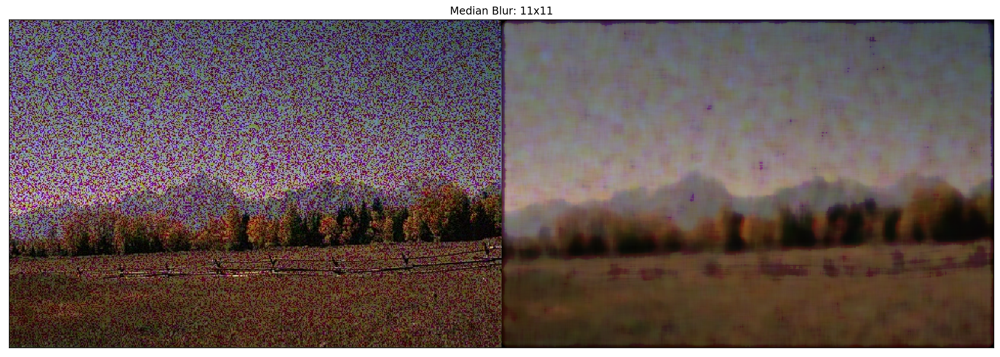

Filter size 9


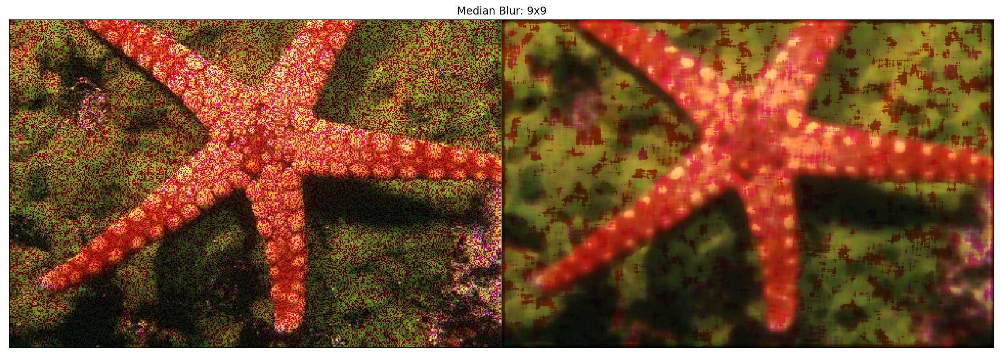

Filter size 3


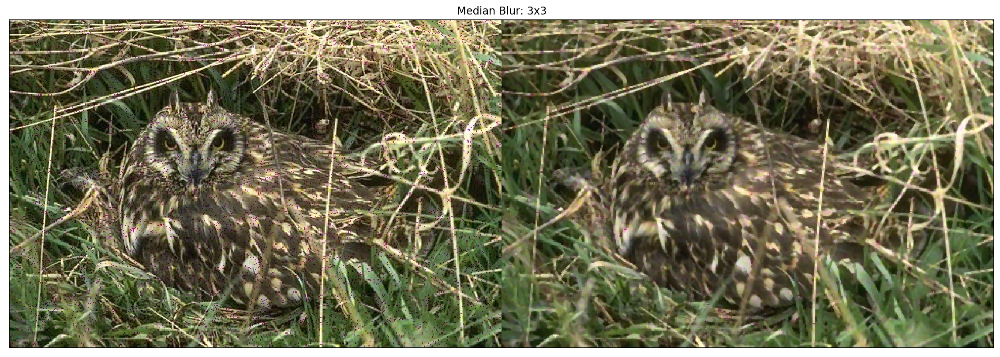

Filter size 5


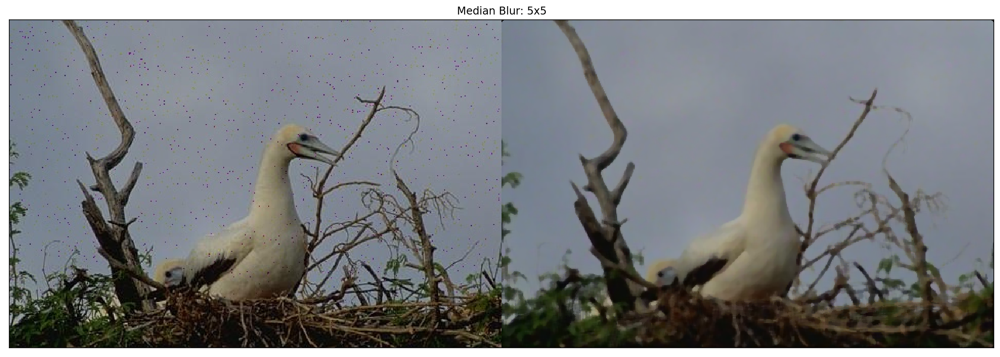

Filter size 5


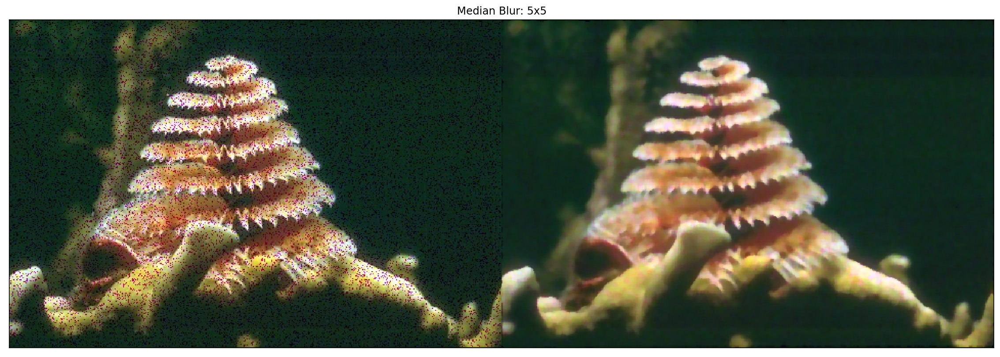

In [35]:
MEDIAN_FILTERS =[11, 9, 3, 5, 5] # Filter sizes for each image.
for i, imagepath in enumerate(imagepaths):
#     if i != 1:
#         continue
    image = my_imread(imagepath)
    image_tensor = torch.from_numpy(np.asarray(image).transpose(-1, 0, 1))  # CxHxW
    image_tensor = image_tensor.to(pytorch_device)
    image_tensor = torch.unsqueeze(image_tensor.float(), dim=0)  # B(=1)xCxHxW
    
    kernel_size = MEDIAN_FILTERS[i]
    median_tensor = kornia.filters.median_blur(image_tensor, (kernel_size,kernel_size))
    median = kornia.tensor_to_image(median_tensor.byte())
    print ("Filter size", MEDIAN_FILTERS[i])
    stack = np.hstack((image, median))
    # Optional: you could choose to use plot_helper to plot stacked image.
    # Make sure it is in RGB before using plot_helper.
    plot_helper(cv2.cvtColor(stack, cv2.COLOR_BGR2RGB), 'Median Blur: %dx%d'%(MEDIAN_FILTERS[i], MEDIAN_FILTERS[i]))